## AIC Calcium data analysis

1. Adjust the Settings in the cell below.<br><br>
2. Run the whole script by pressing *Run* above. Or run cell-by-cell by pressing CTRL+ENTER.
<br>Starting the script will open a file dialog (possibly hidden behind other windows). Select the Labview .lvm file to analyze.
(Only tested for "CalciumRecordings2channels.vi", 2 signal channels + stimulation channel.)<br><br>
3. Check for error messages below each cell, and make necessary changes.
   <br><br> Typical data issues:
   - Problem: detected stimulus frequency/block lenght/ ON/OFF time is wrong.
       -  Cause: Beginning or end of recording contains incomplete stim block that messes up the regular paradigm. 
           -  Solution: Set *CutStart* or *CutEnd* accordingly to remove any incomplete stim. blocks.
 -  Problem: Detected modulation frequency is wrong (e.g. both channels show 980Hz)
     -   Cause: There was too much laser crosstalk.
         -  Solution: Manually set a value for *mod_ch1* or *mod_ch2*.
  -  Problem: Not all or too many signal drops / jumps are detected.
      -  Cause: Unusually high/low noise in the signal. 
          -  Solution: adjust the advanced parameters *xSTD*, i.e. how many standard deviations are considered to be a jump. and *timetoconsider* i.e. how many seconds before and after each time point should be compared. *Tip*: The output of the cell *Fixing jumps in data* shows the time in seconds where each jump is detected. Compare by eye whether these time points make sense. Also it may need a lot of trial and error, better go directly to the *Fixing jumps* cell below, and play around with different values and re-run only that cell.
  -  Problem: Detrending is overfitting the time course or not removing enough baseline oscillations.
      -  Cause: For long stimulation blocks or lots of physiological noise the automaticpolynomial degree may be wrong.
          -  Solution: Go to the *Detrending / Baseline drift removal* cell, check the output *polynomial degree x. Locate the line #pnum=n in the code above, uncomment the line and enter a value larger or smaller than in the output (must be some integer value).
<br><br>
4. To to clear all previous values and prevent errors, run whole script again after changing a parameter (Button with two arrows above, confirm when asked to restart Kernel)
<br><br>
5. Outputs (created in the same folder as the .lvm file):
    -  A .mat file with the same filename as the .lvm file selected. See Matlab cell below for description of its contents. 
    -  Plots are not stored. Manually format them using plotly and store as image.
    -  Two text files, *regressor1_married.1D* and *regressor2_married.1D* are created. Can be used as inputs for AFNI 3DDeconvolve. (Currently fixed at 1s resolution, like usual fMRI TR, and starting from (first stimulus event - *bsl*) selected in the Settings)


Limitations: <br>
- Although it should work for any modulation frequency, the filter settings have only been tested for 1230Hz (channel1) and 980Hz (channel2).<br>
- The automatic stimulus detection and block averaging only works for regular block stimulation, i.e. constant stim.freq., block duration, and inter-stimulus interval during the whole scan.
- Currently its not possible to cut out time periods in the middle of the time course (only start or end), but bad blocks can be removed from the average.


>©2018 AIC 



## Settings

In [1]:
# In case of artifacts, cut off from start or end (in s):
CutStart = 0
CutEnd = 0

# Time resolution after downsampling in s:
tres_new = 0.01

# Plot size
plotsize = (15,10)  # typically 10 to 15 is ok.


#-- Settings for average response plots:

baseline = 10 # baseline to consider before each block
_time = 30 # how many seconds to display after stim block ends
# discardN = (0,1,2)  # Which block to ignore from average (index starts at 0)


#-- AFNI regressors
bsl = 110   # seconds to include before first stimulus event

#-- Create output files?
create_output = True  # True or False


#-- Advanced Settings
# mod_ch1 = 1230  # <-- Enter the mod. freq. manually if automatic detection fails.
# mod_ch2 = 980

xSTD = 5  # How many standard deviations to consider a signal "jump/drop" in the data?
secstoconsider = 2 # How many seconds before and after a signal jump should be compared?


## Import libraries

To install missing libraries that are not included in python by default: type *pip install [libraryname]* in the terminal
- plotly (for nicer plots)
- lvm_read  (to read LabView .lvm files)
- peakutils (to detect peaks in time series, here used to find stimulus events)

In [2]:
import os
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import scipy.io as sio
import lvm_read
from tkinter import Tk
from tkinter.filedialog import askopenfilename
import pandas as pd
import peakutils
from collections import Counter
from scipy.signal import butter, lfilter, freqz
import plotly as py
import plotly.graph_objs as go

plt.style.use('seaborn-white')
%matplotlib inline

py.offline.init_notebook_mode(connected=True)

## Importing Labview recordings

In [3]:
root = Tk()
ftypes = [('LVM file',"*.lvm"),("All Files","*.*")]
ttl = "Select file"

if os.name == 'nt':
    dir1 = 'C:\\'   # Windows
else:
    dir1 = '/Volumes/Zhivaz/'
    
root.focus_force()
# root.withdraw()
file_path = askopenfilename(filetypes = ftypes, initialdir = dir1, title = ttl)
root.deiconify(), root.update(), root.destroy()

data_path = os.path.dirname(file_path)

# to manually select a file:
# file_path='/Volumes/Zhivaz/Ca_data/mouse/20180115/6439_075mA1HzRHP.lvm'

lvm_file = lvm_read.read(file_path)
channel_names = lvm_file[0]['Channel names'] 

# make sure correct channels selected below
chan1=1
chan2=3


N = lvm_file[0]['data'].shape[0]  # total number of data points
fs = int(np.around(1 / lvm_file[0]['Delta_X'][0],decimals=2))
time_sec = np.arange(1/fs,N/fs+1/fs,1/fs)


index = pd.Index(time_sec, name=['originalTime'])
columns = pd.MultiIndex.from_product([['channel1','channel2'],['raw','sin_ref','cos_ref','demod_sin','demod_cos','demod_sin_filtered','demod_cos_filtered','demod_tot']],names=['channel','step'])

# create empty DataFrame
calcium = pd.DataFrame(np.zeros((index.size,columns.size)),index = index, columns = columns)

# Fill in some columns
calcium['channel1','raw'] = -lvm_file[0]['data'][:,chan1]  # check above channel_names list if correct column is chosen here
calcium['channel2','raw'] = -lvm_file[0]['data'][:,chan2]  # minus because AIC amplifier doesnt produces negative voltage signal.
calcium = calcium.sort_index()

calcium = calcium.iloc[int(CutStart*fs):int(len(calcium)-CutEnd*fs),:]
stimchannel = lvm_file[0]['data'][int(CutStart*fs):int(len(lvm_file[0]['data'])-CutEnd*fs),5]

print ('loaded ' + file_path)
print ('sampling rate is : ' + str(fs))

loaded C:/Users/felix/Downloads/6761_E7.lvm
sampling rate is : 10000


## Detecting stimulus events

In [4]:
peakindexes = peakutils.indexes(stimchannel, thres=0.6, min_dist=0.01*fs)
peakindexes_sec=peakindexes/fs
delays = np.around(np.diff(peakindexes_sec),decimals=2)
x = Counter(delays)   #counts elements in the input, and then shows which is most frequent, how often it appears etc...
x1 = x.most_common(1)
n_pulses = x1[0][1]
x2 = x.most_common()[:-2:-1]  #find the longest delay (i.e. the least common value)
n_blocks = x2[0][1] + 1
stim_freq = np.round(1 / x1[0][0])  #remove round() for stim <1Hz
pulses_block = n_pulses / n_blocks + 1
block_duration = np.round(pulses_block / stim_freq)
off_period = x2[0][0] - x1[0][0]
print('stim freq: ' + str(stim_freq) + 'Hz')
print('ON period: ' + str(block_duration) + 's')
print('OFF period: ' + str(off_period) + 's')
period = (block_duration + off_period) * 2
print('Signals slower than ' + str(period) + 's will be removed (later)')

stim freq: 3.0Hz
ON period: 8.0s
OFF period: 82.0s
Signals slower than 180.0s will be removed (later)


## FFT of signal channels

channel 1 is rcamp , with mod. freq.:  1230.0 Hz
channel 2 is gcamp , with mod. freq.:  890.0 Hz


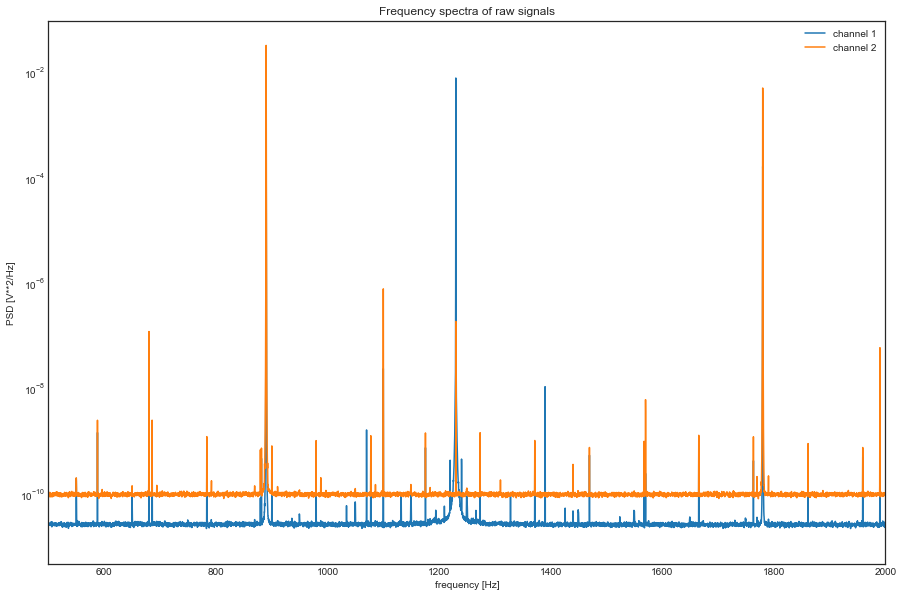

In [5]:
f1, Pxx_den1 = signal.welch(calcium['channel1','raw'], fs, nperseg=65536)

fig = plt.figure(figsize=plotsize)
ax = plt.axes()
ax.semilogy(f1, Pxx_den1, label='channel 1')
ax.set_xlabel('frequency [Hz]')
ax.set_ylabel('PSD [V**2/Hz]')
ax.set_title('Frequency spectra of raw signals')

f2, Pxx_den2 = signal.welch(calcium['channel2','raw'],fs,nperseg=65536)
ax.semilogy(f2, Pxx_den2, label='channel 2')
ax.set_xlim(500, 0.2*fs)
ax.legend()

# Detect modulation frequencies automatically by getting highest peak
if 'mod_ch1' not in locals():
    mod_ch1 = np.around(f1[np.argmax(Pxx_den1)],decimals=0)
if 'mod_ch2' not in locals():
    mod_ch2 = np.around(f2[np.argmax(Pxx_den2)],decimals=0)
    

# double check if this output is correct
print('channel 1 is ' + channel_names[chan1] + ' , with mod. freq.:  ' + str(mod_ch1) + ' Hz')
print('channel 2 is ' + channel_names[chan2] + ' , with mod. freq.:  ' + str(mod_ch2) + ' Hz')

## Demodulating signals

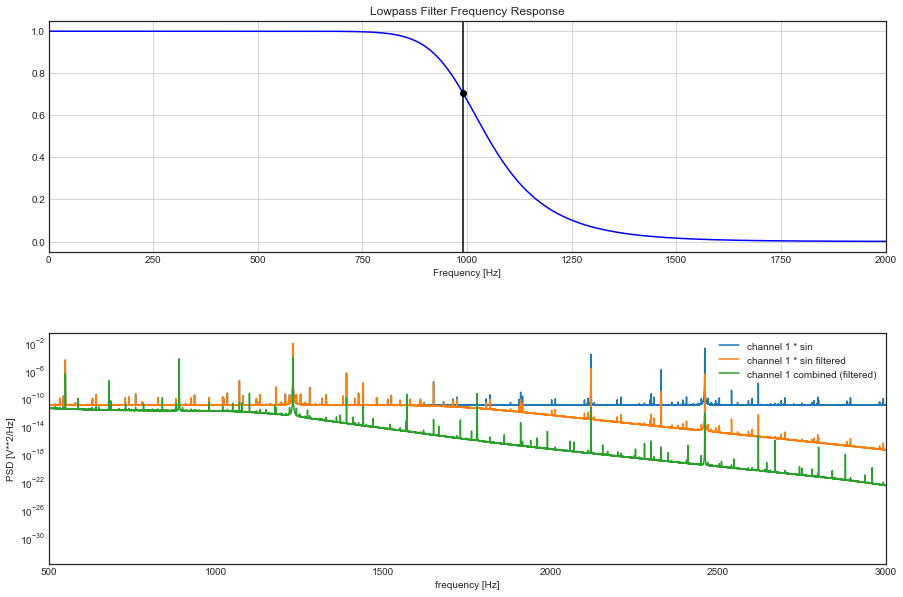

In [6]:
# create reference sin + cos wave forms
calcium['channel1','sin_ref'] = np.sin(2*np.pi*mod_ch1*calcium.index.values)
calcium['channel1','cos_ref'] = np.cos(2*np.pi*mod_ch1*calcium.index.values)

calcium['channel2','sin_ref'] = np.sin(2*np.pi*mod_ch2*calcium.index.values)
calcium['channel2','cos_ref'] = np.cos(2*np.pi*mod_ch2*calcium.index.values)

# multiply them with raw signals
calcium['channel1', 'demod_sin'] = calcium['channel1', 'raw']*calcium['channel1', 'sin_ref']
calcium['channel1', 'demod_cos'] = calcium['channel1', 'raw']*calcium['channel1', 'cos_ref']

calcium['channel2', 'demod_sin'] = calcium['channel2', 'raw']*calcium['channel2', 'sin_ref']
calcium['channel2', 'demod_cos'] = calcium['channel2', 'raw']*calcium['channel2', 'cos_ref']


def butter_lowpass(cutoff, fs, order):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a


def butter_lowpass_filter(data, cutoff, fs, order):
    b, a = butter_lowpass(cutoff, fs, order=order)
    y = lfilter(b, a, data)
    return y

# Filter settings (adjust if laser frequencies change)

order = 9
# initial filter to the sin/cos signal separately
cutoff_1a = mod_ch1+500
cutoff_1b = mod_ch1-100

# final filtering for the combined signal
cutoff_2a = mod_ch2+100
cutoff_2b = mod_ch2-500

# apply initial low pass filter
calcium['channel1', 'demod_sin_filtered'] = butter_lowpass_filter(calcium['channel1','demod_sin'], cutoff_1a, fs, order)

calcium['channel1', 'demod_cos_filtered'] = butter_lowpass_filter(calcium['channel1','demod_cos'], cutoff_1a, fs, order)

calcium['channel2', 'demod_sin_filtered'] = butter_lowpass_filter(calcium['channel2','demod_sin'], cutoff_2a, fs, order)
calcium['channel2', 'demod_cos_filtered'] = butter_lowpass_filter(calcium['channel2','demod_cos'], cutoff_2a, fs, order)

# Combine the sin+cos signals, and apply final low pass filter.
calcium['channel1', 'demod_tot']=1/2*np.sqrt(np.square(calcium['channel1','demod_sin_filtered'])+np.square(calcium['channel1','demod_cos_filtered']))
calcium['channel1', 'demod_tot'] = butter_lowpass_filter(calcium['channel1','demod_tot'], cutoff_1b, fs, order)

calcium['channel2', 'demod_tot']=1/2*np.sqrt(np.square(calcium['channel2','demod_sin_filtered'])+np.square(calcium['channel2','demod_cos_filtered']))
calcium['channel2', 'demod_tot'] = butter_lowpass_filter(calcium['channel2','demod_tot'], cutoff_2b, fs, order)

# Cut off some artifact at beginning caused by the filter.
calcium = calcium.sort_index()
calcium = calcium.iloc[300:, :] 
peakindexes_sec = peakindexes_sec - 300/fs



# Plot a few filter frequency responses and power spectra (channel 1)
which_freq = cutoff_2a
b, a = butter_lowpass(which_freq, fs, order)
w, h = freqz(b, a, worN=8000)
plt.figure(figsize=plotsize)
plt.subplot(2, 1, 1)
plt.plot(0.5*fs*w/np.pi, np.abs(h), 'b')
plt.plot(which_freq, 0.5*np.sqrt(2), 'ko')
plt.axvline(which_freq, color='k')
plt.xlim(0, 0.2*fs)
plt.title("Lowpass Filter Frequency Response")
plt.xlabel('Frequency [Hz]')
plt.grid()


plt.subplot(2, 1, 2)
f, Pxx_den = signal.welch(calcium['channel1','demod_sin'],fs,nperseg=2**16)
plt.semilogy(f, Pxx_den, label='channel 1 * sin')
f, Pxx_den = signal.welch(calcium['channel1','demod_sin_filtered'],fs,nperseg=2**16)
plt.semilogy(f, Pxx_den, label='channel 1 * sin filtered')
f, Pxx_den = signal.welch(calcium['channel1','demod_tot'],fs,nperseg=2**16)
plt.semilogy(f, Pxx_den, label='channel 1 combined (filtered)')
#f, Pxx_den = signal.welch(calcium['channel1','demod_combineBeforeFilter_b'],fs,nperseg=2**16)
#plt.semilogy(f, Pxx_den, label='channel 1 total (filter AFTER combining)')
#plt.ylim([0.5e-3, 1])
plt.xlabel('frequency [Hz]')
plt.ylabel('PSD [V**2/Hz]')
plt.xlim(500, 0.3*fs)
plt.legend()
plt.subplots_adjust(hspace=0.35)


## Downsampling

In [8]:
def downsamplebin(channel, timeres=tres_new, sampling=fs):
    N_samples = int(timeres*sampling)
    lastpoint = int(np.arange(0,np.size(channel), N_samples)[-1])
    out = np.reshape(channel[0:lastpoint], (-1, N_samples))
#     out = np.mean(out, axis=1)
    out = np.median(out, axis=1)
    return out

# create new downsamled DataFrame
start = calcium.index[0]-CutStart
# time_sec_ds = np.arange(start, downsamplebin(calcium['channel1','demod_tot'].values).size*tres_new+start, tres_new)
time_sec_ds = np.arange(start, downsamplebin(calcium['channel1','demod_tot'].values).size*tres_new+start-tres_new, tres_new)
_index = pd.Index(time_sec_ds, name=['downsampled time'])
columns = pd.MultiIndex.from_product([['channel1', 'channel2'],['downsampled_raw','baseline_fit','detrended']],names=['channel','step'])
calcium_ds = pd.DataFrame(np.zeros((_index.size, columns.size)), index=_index, columns = columns)
calcium_ds = calcium_ds.sort_index(axis=0)
calcium_ds = calcium_ds.sort_index(axis=1)
calcium_ds['channel1', 'downsampled_raw'] = downsamplebin(calcium['channel1','demod_tot'].values)[:calcium_ds.index.size]
calcium_ds['channel2', 'downsampled_raw'] = downsamplebin(calcium['channel2','demod_tot'].values)[:calcium_ds.index.size]


## Fixing jumps in data
Some short spikes may remain in the data. This is no problem, it will be averaged out in the downsampling procedure in the next cell.

jump detected in Ch1 at 1367.56s
jump detected in Ch2 at 473.82s


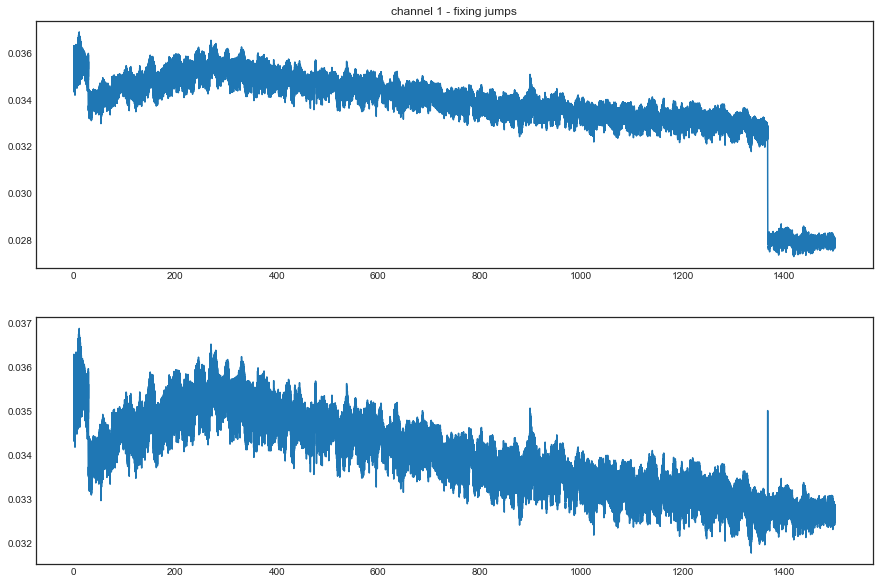

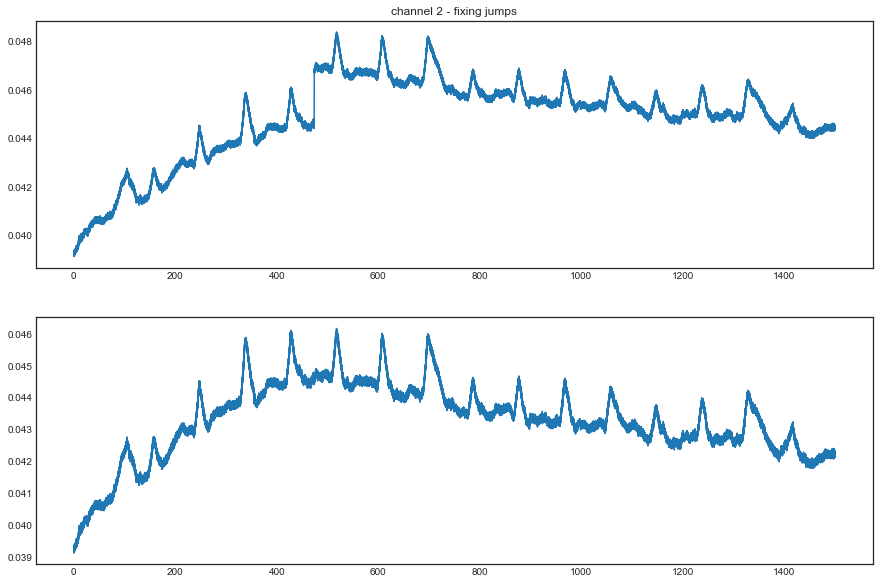

In [9]:
def fixjumps(data, data_x, ch):
    
    xSTD = 6                               #<----------  critical parameter
    
    secstoconsider = 0.5
    delta = 0
    binsize=int(secstoconsider*fs)
    data_cor=np.zeros(data.shape)
    data_cor[:binsize]=data[:binsize]
    data2=np.diff(data)
    data2=data2/np.max(data2)
        
    for i in range(binsize,len(data_x)-1):
        meanprior=np.mean(data2[i-binsize:i-1])
        difference=data2[i]-meanprior
        threshold=np.std(data2[i-binsize:i-1])*xSTD
        if np.abs(difference) > threshold:
            print('jump detected in ' + ch + ' at '+ str(i*tres_new) + 's' )
            delta += np.median(data[i:i+binsize])-np.median(data[i-binsize:i-1])
            data_cor[i]=data[i]-delta
            data_cor[i]=np.median(data_cor[i-3:i])
        else:
            data_cor[i]=data[i]-delta
    data_cor[-1]=data[-1]-delta
    return data_cor


data_cor1 = fixjumps(calcium_ds['channel1', 'downsampled_raw'].values,calcium_ds.index.values, 'Ch1')
data_cor2 = fixjumps(calcium_ds['channel2', 'downsampled_raw'].values,calcium_ds.index.values, 'Ch2')

calcium_ds['channel1','downsampled_fixed'] = data_cor1
calcium_ds['channel2','downsampled_fixed'] = data_cor2

plt.figure(figsize=plotsize)
plt.subplot(2, 1, 1)
plt.title('channel 1 - fixing jumps')
plt.plot(calcium_ds['channel1','downsampled_raw'])
plt.subplot(2, 1, 2)
plt.plot(calcium_ds['channel1','downsampled_fixed'])

plt.figure(figsize=plotsize)
plt.subplot(2, 1, 1)
plt.title('channel 2 - fixing jumps')
plt.plot(calcium_ds['channel2','downsampled_raw'])
plt.subplot(2, 1, 2)
plt.plot(calcium_ds['channel2','downsampled_fixed'])

## Detrending / Baseline drift removal

polynomial degree  9
Approximately high-pass filter with 214.0s period.


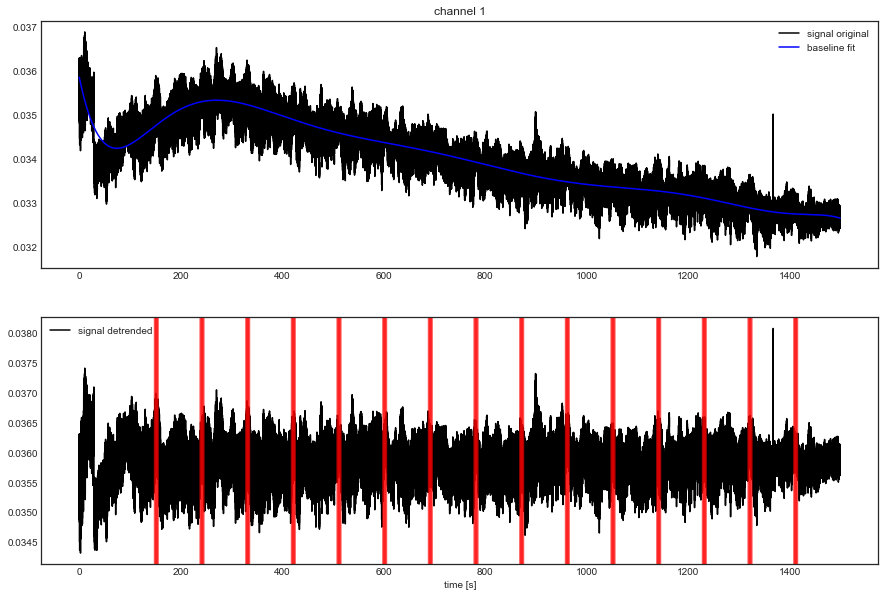

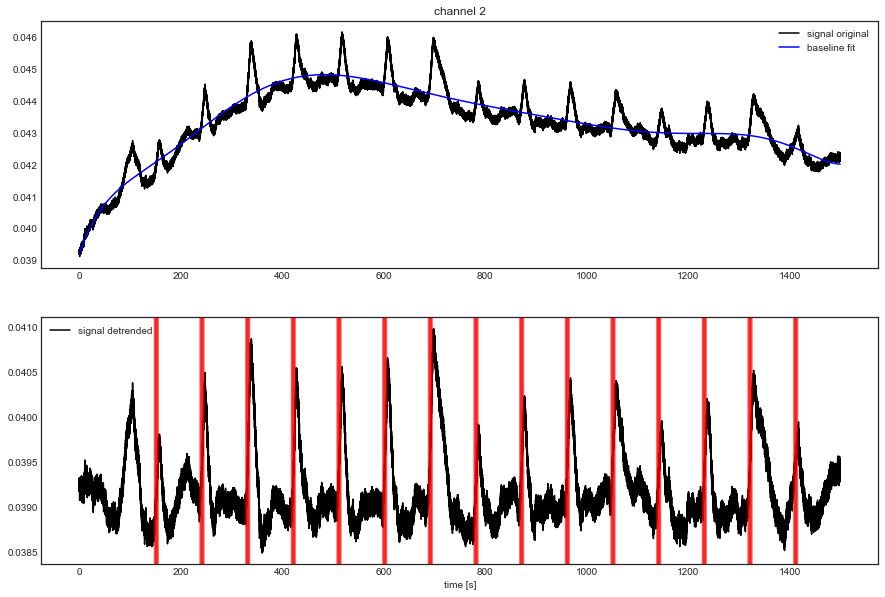

In [10]:
#find degree of polynomial (based on AFNI formula)
D=calcium_ds.index[-1]
#D = len(demod_ch1)*t_res
pnum = 1 + int(D/period)
pHz = (pnum - 2)/D
print('polynomial degree ', str(pnum))
if pnum > 2:
    print('Approximately high-pass filter with ' + str(np.round(1/pHz)) + 's period.' )

# pnum=0 # <-- Manually set polynomial degree, or 0 to turn off detrending.


def calciumDetrend(N):
    fit = np.polyfit(calcium_ds.index,calcium_ds['channel'+N,'downsampled_fixed'],pnum)
    y = np.poly1d(fit)
    calcium_ds['channel'+N,'baseline_fit']=y(calcium_ds.index)
    calcium_ds['channel'+N,'detrended']=calcium_ds['channel'+N,'downsampled_fixed']-calcium_ds['channel'+N,'baseline_fit']+y[0]  #adding the mean value back

    plt.figure(figsize=plotsize)
    plt.subplot(2, 1, 1)
    plt.title('channel ' + N)
    plt.plot(calcium_ds['channel'+N,'downsampled_fixed'], 'k-', label='signal original')
    plt.plot(calcium_ds['channel'+N,'baseline_fit'], 'b-', label='baseline fit')
    plt.legend()

    plt.subplot(2, 1, 2)
    plt.plot(calcium_ds['channel'+N,'detrended'], 'k-', label='signal detrended')
    plt.legend()
    plt.xlabel('time [s]')
    _ = [plt.axvline(_p, alpha=0.2, color='red') for _p in peakindexes_sec]


calciumDetrend('1')
calciumDetrend('2')

In [22]:
# Test:  fitting gaussians

blocks_to_fit, percentage_blocks = make_average_blocks('channel1', baseline=0)

n_models = list(np.arange(0,block_duration,1/stim_freq))


from lmfit.models import ExpressionModel


script = """
def gammavar(ymax, tmax, a, x, t0):
    x_input = x * (x > t0) + (t0 + tmax) * (x <= t0)
    return (exp(log(ymax)+a*(1+log((x_input-t0)/tmax)-(x_input-t0)/tmax))) * (x > t0)
"""

def CreateModel(stimulus_times):

    model = ExpressionModel(f'gammavar(ymax0, tmax0, a0, x, 0.02)',
                            init_script=script,
                            intependent_vars=['x'])
    

    k=1
    for i in stimulus_times[1:]:
        model += ExpressionModel(f'gammavar(ymax{k}, tmax{k}, a{k}, x, {i})',
                            init_script=script,
                            intependent_vars=['x'])
        k += 1
           
    params = model.make_params()
    params['ymax0'].set(value=0.2, min=0.02, max=1)
    params['tmax0'].set(value=2, min=0.1, max=8)
    params['a0'].set(1, min=0.05, max=5)

    for i in range(1,len(stimulus_times)):
        params[f'tmax{i}'].set(expr='tmax0')   
        params[f'a{i}'].set(expr='a0')     
        params[f'ymax{i}'].set(0.2, min=0.02, max=1)  
    
    return model, params


def RunFit(n_models, time, signal):
    model, params = CreateModel(n_models)
    result = model.fit(signal, params, x=time)
    return result

import statsmodels.api as sm
def scaleCa(x,time):
    x = sm.nonparametric.lowess(x, time, frac=0.0018)
    x = x[:,1] - np.min(x[:,1])
    x = x - np.mean(x[:2])
#     x = x*(1/np.max(x))
    return x

time = blocks_to_fit.index.values



# signal = blocks_to_fit.iloc[:,2].values  # single run
# signal_normalized = scaleCa(signal,time) # single run
# result = RunFit(n_models, time, signal_normalized) # single run

# multi run:

result = []

# for column in blocks_to_fit:
#     print(f'fitting block {column} of {blocks_to_fit.shape[1]}')
#     signal = blocks_to_fit[column]
#     signal_normalized = scaleCa(signal,time)
#     result.append(RunFit(n_models, time, signal_normalized))


# range(blocks_to_fit.shape[1])    
from numba import autojit, prange


@autojit
def parallel_job(blocks_to_fit, time, n_models):
    for column in prange(blocks_to_fit.shape[1]):
        print('fitting block '+ str(column+1) + ' of ' + str(blocks_to_fit.shape[1]))
        signal = blocks_to_fit[column]
        signal_normalized = scaleCa(signal,time)
        result.append(RunFit(n_models, time, signal_normalized)) 
    return result

result = parallel_job(blocks_to_fit, time, n_models)
    


# print(result.fit_report())
# plt.figure(figsize=[50,50])
# plt.plot(time, signal_normalized)
# plt.plot(time, result.best_fit)

fitting block 1 of 15
fitting block 2 of 15
fitting block 3 of 15
fitting block 4 of 15
fitting block 5 of 15
fitting block 6 of 15
fitting block 7 of 15
fitting block 8 of 15


KeyboardInterrupt:  in expr='<>'
 Error running <Procedure gammavar(ymax, tmax, a, x, t0)>

In [21]:
regressors = pd.DataFrame(np.zeros((calcium_ds.index.size, 2)), index=calcium_ds.index.values,  columns = ['channel1', 'channel2'])
# regressors['channel1'] = calcium_ds['channel1','downsampled_fixed'].values
# regressors['channel2'] = calcium_ds['channel2','downsampled_fixed'].values


for i in range(len(result)):
    _blockbegin = peakindexes_sec[0+i*int(block_duration*stim_freq)]
    regressors.loc[_blockbegin:_blockbegin+time[-1], 'channel1'] = result[i].best_fit



from ipywidgets import interact

def interactiveplot(block):
    plt.figure(figsize=[40,40])
    plt.plot(time, scaleCa(blocks_to_fit[block], time))
    plt.plot(time, result[block].best_fit)
    plt.show()
interact(interactiveplot, block=(0,blocks_to_fit.shape[1]-1,1))
    
# plt.plot(regressors/10)
# plt.plot(calcium_ds['channel1','downsampled_fixed']*10)

interactive(children=(IntSlider(value=7, description='block', max=14), Output()), _dom_classes=('widget-intera…

<function __main__.interactiveplot(block)>

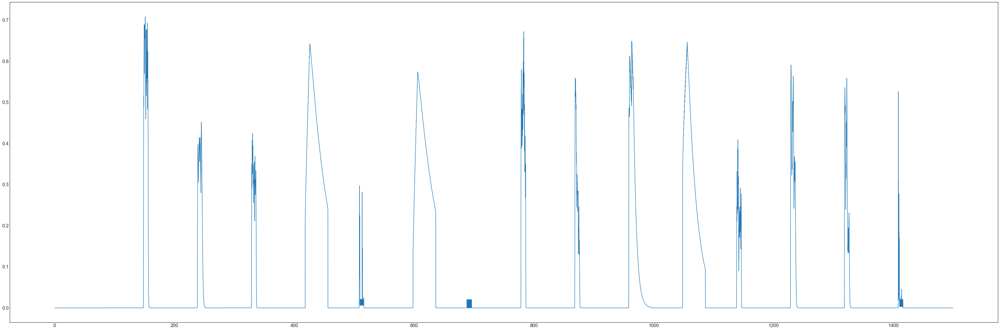

In [20]:
plt.figure(figsize=[60,20])
plt.plot(regressors['channel1'])

## Averaging stimulation blocks

(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)


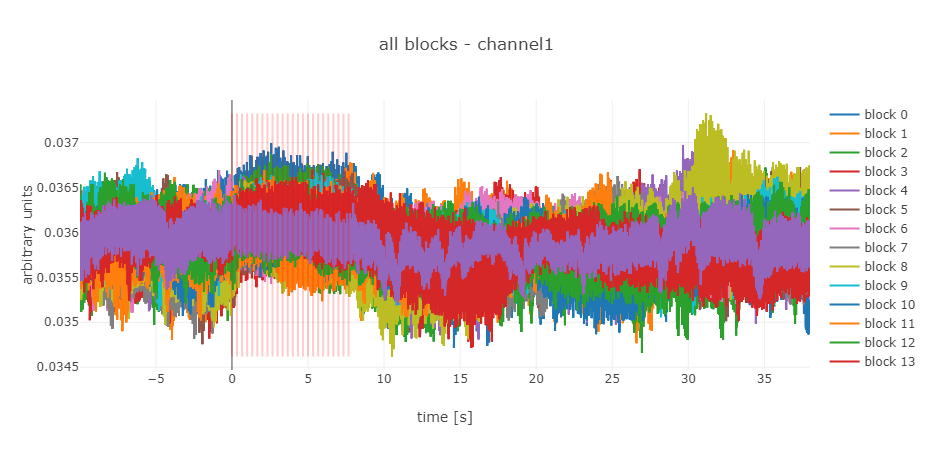

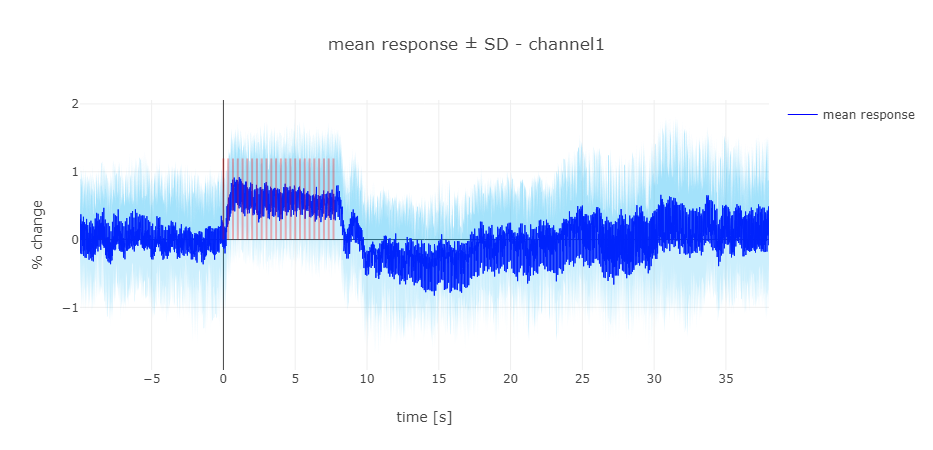

(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)
(4800,)


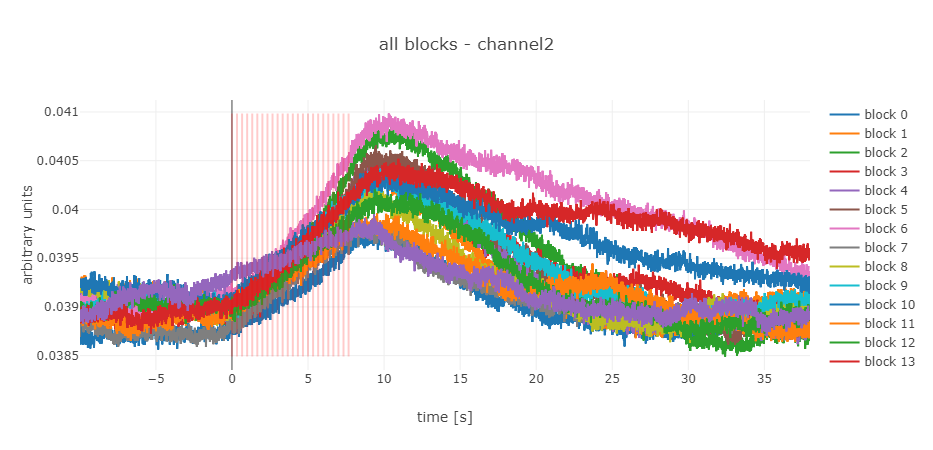

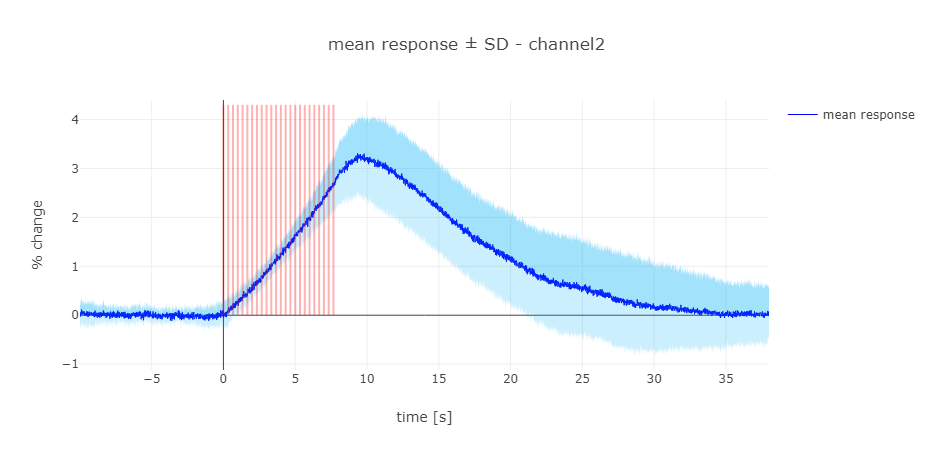

In [16]:
def make_average_blocks(which_channel, baseline=baseline):
    idx = pd.IndexSlice  #see my notes, this allows slicing multilevel data
    
    block = []
    for n in range(n_blocks):
        _blockbegin = peakindexes_sec[0+n*int(block_duration*stim_freq)]
        block.append(calcium_ds.loc[idx[_blockbegin-baseline:_blockbegin+block_duration+_time],idx[which_channel,'detrended']].reset_index(drop=True))
        test = calcium_ds.loc[idx[_blockbegin-baseline:_blockbegin+block_duration+_time],idx[which_channel,'detrended']]
        print(test.shape)
    if 'discardN' in locals():
        for i in sorted(discardN, reverse=True):
            del block[i]


    #block_time = np.arange(-baseline-tres_new,block_duration+_time,tres_new)  #sometimes error "length of values doenst match lengh of index", then change to:   (-baseline+tres_new...
    block_time = np.arange(-baseline,block_duration+_time,tres_new)  #sometimes error "length of values doenst match lengh of index", then change to:   (-baseline+tres_new...
    blockIndex = pd.Index(block_time+tres_new, name='Time [s]')
    blocks = pd.concat(block, axis=1, ignore_index = True)
    blocks['time'] = blockIndex
    blocks.set_index('time',drop=True,inplace=True)
    

    # taking the mean before every block as its own baseline to calculate percentage
    blocks = blocks.sort_index(axis=0)
    blocks = blocks.sort_index(axis=1)
    blocks_percent = (blocks / blocks.loc[-baseline:0,:].mean() - 1)*100

    blocks_percent['mean'] = blocks_percent.mean(axis=1)
    blocks_percent['SD'] = blocks_percent.std(axis=1)
    blocks_percent['upper'] = blocks_percent['mean']+blocks_percent['SD']
    blocks_percent['lower'] = blocks_percent['mean']-blocks_percent['SD']
    
    return blocks, blocks_percent


def plot_averages(which_channel):
 
    blocks, blocks_percent = make_average_blocks(which_channel)
    
    plt.rcParams.update({'font.size': 16})

    
    shapes1 = list()
    for i in np.arange(0,block_duration,1/stim_freq):
        shapes1.append({
            'type': 'line',
            'xref': 'x',
            'yref': 'y',
            'x0': i,
            'y0': np.min(blocks.min(axis=1)),
            'x1': i,
            'y1': np.max(blocks.max(axis=1)),
            'opacity':0.2,
            'layer': 'above',
            'line':{
                'color':'red',
            },
        })

 
    shapes2 = list()
    for i in np.arange(0,block_duration,1/stim_freq):
        shapes2.append({
            'type': 'line',
            'xref': 'x',
            'yref': 'y',
            'x0': i,
            'y0': 0,
            'x1': i,
            'y1': np.max(blocks_percent['mean'].values)*1.3,
            'opacity':0.3,
            'layer': 'above',
            'line':{
                'color':'red',
            },
        })  
    
    allshapes=[shapes1, shapes2]
    
    def plotlylayout(what, units, percent):
        layout1 = go.Layout(
            title=what + ' - ' + which_channel,
            yaxis=dict(
                title=units
            ),
            xaxis=dict(
                title='time [s]'
            ),
            shapes=allshapes[percent]
        )
        return layout1
        
    traceA=[]
    for i in range(blocks.columns.size):
        traceA.append(go.Scatter(x=blocks.index.values, y=blocks.iloc[:,i].values, mode = 'lines', name = 'block '+str(i)))
    
    fig = go.Figure(data=traceA, layout=plotlylayout('all blocks','arbitrary units',0))
    py.offline.iplot(fig)
   

    traceB=go.Scatter(x=blocks_percent.index.values, y=blocks_percent['mean'].values, mode = 'lines' ,line=dict(width=1, color='blue'), name = 'mean response')
    
    traceB_lower = go.Scatter(
    x=blocks_percent.index.values,
    y=blocks_percent['lower'].values,
    mode='lines',
    marker=dict(color="black"),
    fill='tonexty',
    fillcolor='rgba(0,176,246,0.2)',
    line=dict(width=0),
    name='lower bound',
    showlegend=False,
    )
  
    
    traceB_upper = go.Scatter(
    x=blocks_percent.index.values,
    y=blocks_percent['upper'].values,
    mode='lines',
    marker=dict(color="black"),
    fill='tonexty',
    fillcolor='rgba(0,176,246,0.2)',
    line=dict(width=0),
    name='upper bound',
    showlegend=False,
    )
    
    
    fig = go.Figure(data=[traceB, traceB_upper, traceB_lower], layout=plotlylayout('mean response ± SD', '% change',1))
    py.offline.iplot(fig)
    

blocks_perc_ch1 = plot_averages('channel1')
blocks_perc_ch2 = plot_averages('channel2')


In [11]:
# Fitting gamma variate to response  --  could be used as regressor in future

import numpy as np
import matplotlib.pyplot as plt

# t=np.arange(0,10,1/fs)
t=mean_calcium_response.index.values-mean_calcium_response.index.values.min()

# parameters
# ymax=1
# tmax=2
# a=10

t_gamma=t[:np.int(3/tres_new)]
def gammavar(ymax,tmax,a):
    t2=t_gamma/tmax
    return np.exp(np.log(ymax)+a*(1+np.log(t2)-t2))

plt.figure()
plt.plot(t_gamma,gammavar(ymax,tmax,a))


events = list(frange(0,block_duration,1/stim_freq))-mean_calcium_response.index.values.min()
events = np.round(events*1/tres_new).astype(int)


def gammvarModel(t,ymax,tmax,a):
#     baseline = np.zeros((total_duration*fs,1))
    baseline = np.zeros(t.size)
#     events = np.array(np.dot([10, 13, 16, 19],1/tres_new)).astype(int)
    baseline[events] = 1
    fit = np.convolve(np.ravel(baseline),gammavar(ymax,tmax,a))[0:t.size]
    return fit
    
plt.figure()
plt.plot(t,gammvarModel(t,1,tmax,a))



y_noise = 0.3 * np.random.normal(size=t.size)
y_data = gammvarModel(t,ymax,tmax,a) + y_noise

plt.figure()
plt.plot(t,y_data)

NameError: name 'mean_calcium_response' is not defined

In [ ]:
from scipy.optimize import curve_fit as curve_fit


# popt, pcov = curve_fit(gammvarModel,t,y_data)
popt, pcov = curve_fit(gammvarModel,t,mean_calcium_response.values)




# plt.plot(t, y_data, 'b-')
plt.plot(t, mean_calcium_response.values, 'b-')
plt.plot(t, gammvarModel(t, *popt), 'r--')
plt.show()

plt.figure()
plt.plot(t_gamma,gammavar(*popt))


popt


## Storing Response in Matlab file

Contents of the file are arranged like this:<br>
<br>
-Channel 1
    -  mean (of all blocks, in percent signal)
    -  SD (standard deviation across blocks)
    -  time (x axis)
    -  stim (stim pulses in seconds)
-Channel 2 
    -  mean (of all blocks, in percent signal)
    -  SD (standard deviation across blocks)
    -  time (x axis)
    -  stim (stim pulses in seconds)

In [ ]:
matfilename=os.path.splitext(os.path.basename(file_path))[0]
storagepath=os.path.join(os.path.abspath(data_path))
print(matfilename)
#matfilename='6793_E8'

contentsCh1 = {'mean': blocks_perc_ch1['mean'].values, 'SD': blocks_perc_ch1['SD'].values, 'time': blocks_perc_ch1.index.values, 'stim':list(frange(0,block_duration,1/stim_freq)) }
contentsCh2 = {'mean': blocks_perc_ch2['mean'].values, 'SD': blocks_perc_ch2['SD'].values, 'time': blocks_perc_ch2.index.values, 'stim':list(frange(0,block_duration,1/stim_freq)) }

if create_output:    
    sio.savemat(os.path.join(storagepath,matfilename),{matfilename+ ' Channel 1':contentsCh1, matfilename+ ' Channel 2':contentsCh2})
    print(matfilename + '.mat successfully stored under ' + storagepath)


## Creating regressor files for AFNI

In [ ]:
# cutting off calcium trace
idx = pd.IndexSlice

ch1cut = calcium_ds.loc[idx[peakindexes_sec[0]-bsl:],idx['channel1','detrended']].values
ch2cut = calcium_ds.loc[idx[peakindexes_sec[0]-bsl:],idx['channel2','detrended']].values

# Downsampling further to 1s TR
ch1ds = downsamplebin(ch1cut, timeres=1, sampling=1/tres_new)
ch2ds = downsamplebin(ch2cut, timeres=1, sampling=1/tres_new)
regtimes = np.array(range(ch1ds.size))


# scaling trace between 0 and 1
def scaleCa(x):
    x = x - np.min(x)
    x = x*(1/np.max(x))
    return x

ch1ds2 = scaleCa(ch1ds)
ch2ds2 = scaleCa(ch2ds)


plt.figure(figsize=plotsize)
plt.plot(ch1ds2)

plt.figure(figsize=plotsize)
plt.plot(ch2ds2)

# 3dmarry function
# input:  a=[1, 2] b=[2.4, 3.7]
# output should look like:  1*2.4 2*3.7
def Marry(time,amplitude,regressorN):
    outputs=[]
    for time, amplitude in zip(time,amplitude):
        output='{:d}'+'*'+'{:f} '
        formatted=output.format(time,amplitude)
        outputs.append(formatted)

    regressorfilename = os.path.join(os.path.abspath(data_path), regressorN + '_married.1D')
    thefile = open(regressorfilename, 'w')
    for item in outputs:
      thefile.write("".join(item))
    print(str(regressorfilename),'created')

if create_output:    
    Marry(regtimes,ch1ds2,'regressor1')
    Marry(regtimes,ch2ds2,'regressor2')
